# Introduction
It is important to state here that this code follows the pre-processing of the images in our Dataset as well as the creation of a csv files for the training and testing of our algorithm

## Importing all necessary functions

In [1]:
### Import all necessary libraries

import numpy as np
import random as rd
import cv2
import glob
from skimage import io
from matplotlib import pyplot as plt
import pandas as pd
import dill
import copy

## Let us define a function to display images, it will be useful later

In [2]:
def display_img(image):
    fig = plt.figure(figsize=(image.shape[1]/80, image.shape[0]/80))
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

## HOG
We start by defining a HOG() function that computes the Histogram of Oriented Gradients of any 64x128 image.
The function takes as parameter the numpy array representing said image and returns a 3708-element vector corresponding to the HOG of the function.


In [3]:
## Function HOG
#We start by defining a HOG() function that computes the Histogram of Oriented Gradients of any 64x128 image.
#The function takes as parameter the numpy array representing said image and returns a 3708 elements vector corresponding to the HOG of the function.

def HOG1(img):       
    # It is necessary here to start by normalizing the image
    img = np.float32(img) / 255.0     # All the values are between 0 and 1
    kernelX = np.float32([[0, 0, 0],
                        [-1, 0, 1],    #Here we design two kernels,  
                        [0, 0, 0]])    # one to get the "horizontal" derivate of the gradient
    kernelY = np.float32([[0, -1, 0],                        # (derivate with regard to X)
                        [0, 0, 0],     # And the other one to get the "vertical" derivate of the gradient
                        [0, 1, 0]])                                   # (derivate with regard to Y)
    tempX = cv2.filter2D(img, -1, kernelX) # We convolute the image with the two kernels
    tempY = cv2.filter2D(img, -1, kernelY)   # And set the result in grayscale
    gX = cv2.cvtColor(tempX, cv2.COLOR_BGR2GRAY)  # Indeed the color information is not relevant for us
    gY = cv2.cvtColor(tempY, cv2.COLOR_BGR2GRAY)   # We get gX and gY the gradient image with regard to X and Y
    Norm, Angle = cv2.cartToPolar(gX, gY, angleInDegrees=True)
    # This function here allows, using gX and gY, to obtain the Norm and Angle of the gradient.
    # It exploits the formulas : Norm = sqrt(gX^2 + gY^2)  and Angle = atan(gY/gX)  (to apply to every pixel)
    for i in range(128):
        for j in range(64):              # The Angle matrix contains value between 0° and 360°
            if Angle[i, j] >= 180:       # Such a wide range of values is useless, therefore we reduce it here to 
                Angle[i, j] = Angle[i, j] - 180                 # values between 0° (included) and 180° (excluded)
    
    # We now have the orientation and norm values of the gradient for each pixel
    # The next step is to separate the image into 8x8 cells and compute an histogram of oriented gradients for each
    cellsHOG = np.array([[[0.0]*9]*8]*16)
    # We have 16 rows of 8 cells, and for each one the histogram can be represented as a 9-element vector
    # Each element corresponding to a discrete orientation of the gradient.
    discAngle = np.array([0, 20, 40, 60, 80, 100, 120, 140, 160])
    # This vector represents the 9 discrete values for the orientation of the gradient.
    for j in range(0, 128, 8):
        for i in range(0, 64, 8):       # Here we are simply creating the 8x8 cells, for both Norm and Angle matrices
            cellNorm = Norm[j:j+8, i:i+8]
            cellAngle = Angle[j:j+8, i:i+8]
            hogCell = np.array([0.0]*9)   # For each cell we represent the histogram as a 9-element vector
            for x in range(8):
                for y in range(8): # (for each pixel in the cell and for each orientation value)
                    for k in range(1, 8):
                      # Each pixel's orientation value is between two discrete orientation values.
                      # We split the norm value of the gradient between each discrete orientation value,
                      # according to the distance between the 2 discrete values and the real one (the one of the pixel).
                      # For example, if the real orientation is 10° and the norm is 1, we will put 0.5 in the spot
                      # corresponding to 0° and 0.5 in the spot corresponding to 10°.
                        if (discAngle[k-1] <= cellAngle[x, y]) and (cellAngle[x, y] <= discAngle[k]) :
                            hogCell[k-1] = hogCell[k-1] + (cellAngle[x, y] - discAngle[k-1])*(cellNorm[x, y]/20)
                            hogCell[k] = hogCell[k] + (discAngle[k] - cellAngle[x, y])*(cellNorm[x, y]/20)
                    # The case where the angle is bigger than 160° is treated almost the same way:
                    # It means the angle is between 160° and 180° (180° being the max as we assured before)
                    # So we consider 180° as we would consider 0°, and split the norm value between the 160° spot
                    # and the 0° spot, according to the distances computed as before, using 180° instead of 0°.
                    if cellAngle[x, y] > discAngle[8]:
                        hogCell[8] = hogCell[8] + (cellAngle[x, y] - discAngle[8])*(cellNorm[x, y]/20)
                        hogCell[0] = hogCell[0] + (180 - cellAngle[x, y])*(cellNorm[x, y]/20)
            cellsHOG[j//8, i//8] = hogCell # hogCell represents the hog for the current cell
            #cellsHOG is a matrix that contains the HOG of each cell, sorted by position of the cell in the image
    
    # For the last step we need to design 16x16 overlapping blocks (each containing 2x2 cells)
    # (each cell is present in one block at least and four blocks at most)
    blocksNormalHOG = np.array([])
    for k in range(len(cellsHOG)-1):
        for h in range(len(cellsHOG[0])-1):   # Here we design those blocks
            vec = np.array([])
            for b in range(k, k+2):   # Each block has 4 cells, so it has four 9-element vectors representing a HOG.
                for c in range(h, h+2):  # We concatenate these 4 vectors for each block
                    vec = np.concatenate((vec, cellsHOG[b, c]))   # And we get a 36-element vector for each block.
            vec = vec/np.linalg.norm(vec) # We normalize all these 36-element vectors.
            blocksNormalHOG = np.concatenate((blocksNormalHOG, vec))
            # And then we just have to concatenate them.
            # We had 8x16 cells, which means (since we use overlapping blocks of 2x2 cells) that we have 7x15 blocks.
            # The final vector we are returning has then 7x15x36 = 3780 elements.
    
    return blocksNormalHOG

In [4]:
from skimage.feature import hog
def HOG(image):
    return hog(image, orientations=9, pixels_per_cell=(8,8), cells_per_block=(2,2), block_norm='L2')

### Time comparison between our HOG algorithm and the one from the scikit-image package

In [4]:
import time
img = cv2.imread("Pedestrians//Patch_Video_Human.jpg")
start_time = time.time()
h1 = HOG1(img)
end_time = time.time()
print(end_time - start_time)
start_time = time.time()
h2 = HOG(img)
end_time = time.time()
print(end_time - start_time)

0.4042537212371826
0.0029582977294921875


We can see our HOG function takes more than 50 times longer to execute than the built-in function from the scikit-image library. While our function works well, in practice, its computing time is too long for us to be able to use it on images, as it is explained in the report. We therefore choose to use the hog function from the scikit-image package, in order to be able to show results.

## Design of the linear SVM model
Here we design by ourselves a linear SVM model adapted to our dataset

In [5]:
## Designing the SVM model through object-oriented programming

class Linear_SVM:
    # The init function will be useful to create the SVM object and will do the fitting as well
    def __init__(self, X, y, iter_nb, lr, C):
        
        self.X = X.values
        self.y = y.values
        self.iter_nb = iter_nb
        # This is simply the number of iterations to do
        self.lr = lr
        # lr is the learning rate for the gradient descent approach used here
        self.C = C
        # C is a coeff defining the impact of each support vector on the updating of the vector w
        
        # Initialize normal vector by setting all its element at 1, then w will be reduced during the fitting phase
        # The vector w defines the hyperplane separating the 'pos' samples from the 'neg' ones
        # (w is actually the vector normal to the hyperplane)
        # Its length has to be the same as any vector sample from the training set as it belongs to the same space
        self.w = np.ones(len(self.X[0]))    
    
    def distances(self, w):
        # We compute the distances between the sample and the current hyperplane defined by the current vector w
        # We know that (xi.w +b) >= 1 or <= -1 according to the sample being 'pos' or 'neg'
        # Since, for all 'neg' samples, yi = -1, and for all 'pos' samples yi = 1
        # The absolute distance of a sample (xi, yi) to the hyperplane's margin corresponds to yi*(xi.w + b) - 1
        # (This is true because we considered the width of the margin to be 1)
        distances = self.y * (np.dot(self.X, w)) - 1
        
        # The support vectors (located between the two margins) have a distance inferior to 0
        # (Such distances exist in our dataset only if w is not optimal yet)
        distances[distances > 0] = 0
        # All vectors that aren't on support vectors now have distances equal to 0
        # This will allow us to identify which vectors are on the support vector
        # And will allow us to apply the Lagrange multiplier

        return distances
    
    def get_cost_grads(self, X, w, y):
        
        # We compute a list of distances defined by the previous function
        distances = self.distances(w)

        # L is the current cost defined by the following formula:
        # L = |w|²/2 - sum(distance_i*coeff_i)
        L = 1 / 2 * np.dot(w, w) - self.C * np.sum(distances)
        
        dw = np.zeros(len(w))
        
        # We use the index and value of each element in the list "distances"
        for index, val in enumerate(distances):
            if val == 0:  
                # As said earlier, this means the sample is not on the support vector
                # (alpha = 0 for Lagrange multiplier)
                di = w  # We keep the initial value of w as di, no need to change it here
                # In other words, the current value of w "works" for this sample
                # (we are applying the gradient descent method with the Lagrange multiplier)
            else:
                # Here we have a support vector, it's not supposed to happen with an optimal value of w
                # (alpha = 1 for Lagrange multiplier)
                di = w - (self.C * y[index] * X[index]) # We compute an other value of a vector normal to
                # the optimal hyperplane, according to the gradient descent method
            dw += di
        return L, dw / len(X) #dw corresponds to a mean of all the di, and will be used to update the value of w
        # L is the objective cost function, and dw/len(X) is the gradient
    
    def fit(self):   
        # This is the fitting phase, where we find the optimal 
        # We obviously do a number of iterations equal to iter_nb
        # In reality we rarely can get the optimal value of w but we can get very close
        for i in range(self.iter_nb):
            L, dw = self.get_cost_grads(self.X, self.w, self.y)
            # We compute the cost function and the gradient of w at each iteration
            self.w = self.w - self.lr * dw
            # We update the value of w using the learning rate and the gradient
            # The gradient and cost values change at each iteration because w changes
            # (And because the "distances" list changes as well as a result of w being updated)

    def predict(self, X):
        return X @ self.w
        # The value of y_i corresponds to x_i.w
        # This prediction needs to be used with a threshold to do the prediction
    
    # Here we want a specific way of training the SVM for better results
    def fit_with_false_pos(self, nb_iter=1):
        # We train it the classic way
        self.fit()
        for k in range(nb_iter):
            # We look at the prediction results on the training dataset
            y_pred = self.predict(self.X)
            false_pos_ind  = [] 
            for i in range(len(y_pred)):
                # With this test, we look into the false positives
                if int(y_pred[i]) == 1 & int(self.y[i]) == -1:
                    # We add the false positives to the training dataset
                    np.append(self.y, self.y[i])
                    np.append(self.X, self.X[i])
                    # We register the indexes of the rows that have been duplicated in the training set
                    false_pos_ind.append(i)
            # We train again using this new training set
            # This way we hope to get less false positives
            self.fit()
            for index in false_pos_ind:
                # Here we use the registered indexes of the duplicated rows to delete them from the dataset
                np.delete(self.y, index)
                np.delete(self.X, index)
            
                    
    
    def test(self, X_t, Y_t, conf_thresh):
      X = X_t.values
      Y = Y_t.values
      p = SVM.predict(X_test)
      indicesP = [i for (i,v) in enumerate(p) if v>conf_thresh]
      ## All the values in that list correspond to the indices of samples detected as humans
      indicesY = [i for (i,v) in enumerate(Y_test) if v==1]
      ## All the values in that list correspond to the indices of samples corresponding to humans
      truePos = []
      falsePos = []
      falseNeg = []
      # We compute the lists of true positives, false positives, and false negatives
      corr_pred = np.isin(indicesP, indicesY)
      predicted_pos = np.isin(indicesY, indicesP)
      # Those lists contain booleans
      # corr_pred contains True for all values (at the adequate index) of indicesP that are also in indice Y
      # and contains false when a value from indicesP is not in indicesY, so it has same length as indicesP
      # predicted_pos does the same thing but contains True for every value in indicesP that we find in indicesY
      for i in range(len(indicesP)):
        if corr_pred[i] == True:
          truePos.append(indicesP[i])
        else:
          falsePos.append(indicesP[i])
      for j in range(len(indicesY)):
        if predicted_pos[j] == False:
          falseNeg.append(indicesY[i])
      trueNeg_len = len(Y_test)-len(truePos)-len(falsePos)-len(falseNeg)
      # We compute the number of true negatives from the other numbers
      print("Test Accuracy: ", (len(truePos)+trueNeg_len)/len(Y_test))
      print("Test false positive rate: ", len(falsePos)/len(indicesP))
      print("Test missed rate: ", len(falseNeg)/(len(falseNeg)+trueNeg_len))

## Creating, training, testing and saving the SVM

In [ ]:
train_data = pd.read_csv("Datasets//Train//train_data_b.csv", index_col=0)
test_data = pd.read_csv("Datasets//Train//test_data_b.csv", index_col=0)
train_data = train_data.dropna() # We drop all invalid values,
test_data = test_data.dropna()   # whatever phase of the dataframes building they come from

X_train = train_data.drop("label", axis="columns")
Y_train = train_data["label"]
X_test = test_data.drop("label", axis="columns")
Y_test = test_data["label"]

SVM = Linear_SVM(X=X_train, y=Y_train, iter_nb=10000, lr=1e-3, C=30)
SVM.fit_with_false_pos()
SVM.test(X_test, Y_test, conf_thresh=0.6)

SVM.X = None
SVM.y = None
# The X and y attributes are useless once the training is over and take a huge amount of disk space
# so we set them to None before saving the model. Basically, we only need w, but we keep some other attributes
# in case we would want to get some informations about how the training has been done (except info about X and y).
file = open('Saved//SVM_b','wb')
dill.dump(SVM, file)
file.close()

## Importing an existing SVM

In [6]:
file2 = open('Saved//SVM_b','rb')
SVM = dill.load(file2)
file2.close()

### Testing the imported SVM

In [7]:
test_data = pd.read_csv("Datasets//Test//test_data_b.csv", index_col=0)
test_data = test_data.dropna()

X_test = test_data.drop("label", axis="columns")
Y_test = test_data["label"]

SVM.test(X_test, Y_test, conf_thresh=0.4)
# We test the imported SVM algorithm

Test Accuracy:  0.9688826025459689
Test false positive rate:  0.0031380753138075313
Test missed rate:  0.036808510638297876


## Human Detection

In [8]:
def HumanDetector(img):
    return SVM.predict(HOG(img))
    # The HumanDetector function returns the objectiveness score for any image of shape 64x128 it is used on
    # It computes first its HOG feature descriptor vector and then run the SVM prediction on said HOG vector

def detect_humans_noScale(img, conf_thresh):
    windowSize = [128, 64]
    stepSizeY = windowSize[0]//8
    stepSizeX = windowSize[1]//8
    pic = img
    rect = np.array([[0, 0, 0, 0]])
    obj_score = np.array([0])
    # We define the window size and the stepSize for each dimension
    for y in range(0, len(pic)-windowSize[0], stepSizeY):
        for x in range(0, len(pic[0])-windowSize[1], stepSizeX):
            # We iteratively look at several consecutive windows in the image
            window = pic[y:y+windowSize[0], x:x+windowSize[1], :]
            if HumanDetector(window) > conf_thresh:
              # If the objectiveness score of the HumanDetector is above the chosen threshold:
              # the window is considered as containing a human, and we call those windows "bounding boxes"
                ## rect contains the coordinates of the bounding boxes
                rect = np.append(rect, np.array([[x, y, x+windowSize[1], y+windowSize[0]]]), axis=0)
                ## obj_score contains the objectiveness score for all the bounding boxes produced by this function
                obj_score = np.append(obj_score, HumanDetector(window))
    rect = np.delete(rect, 0, 0)
    obj_score = np.delete(obj_score, 0)
    # Those lists are of the same length, which is important
    # As obj_score[i] corresponds to the objectiveness score of the bounding boxes which coordinates are in rect[i]
    return [rect, obj_score]

import copy

def detect_with_scale(pic, conf_thresh):
    windowSize = [128, 64]
    #scale_prop is the scaling factor
    scale_prop = 1
    # boxes will contain the coordinates of all the boxes where a human has been detected
    boxes = np.array([[0, 0, 0, 0]])
    obj_score_s = np.array([0])
    # We save the objectiveness scores again
    pic_orig = copy.deepcopy(pic)
    while len(pic)>windowSize[0] and len(pic[0])>windowSize[1] and scale_prop>0.2:
        width = int(pic_orig.shape[1] * scale_prop)
        height = int(pic_orig.shape[0] * scale_prop)
        # We compute the new width and height of our image thanks to the scaling factor, and resize the image
        # We have to be careful here to use the shape of the original image, and not the modified shape
        dim = (width, height)
        pic = cv2.resize(pic, dim, interpolation=cv2.INTER_AREA)
        # We compute the list rect of coordinates of bounding boxes, using the previous function
        [rect, obj_score] = detect_humans_noScale(pic, conf_thresh)
        # But we have to take the scaling factor into consideration regarding these coordinates
        # rect_real will be the list of coordinates of those bounding boxes in the original image
        rect_real = rect
        for i in range(len(rect)):
            for j in range(4):
                rect_real[i, j] = rect[i, j]*(1/scale_prop)
                # We divide the boxes' coordinates by the current scaling factor
                # This allows to display boxes of the correct size
        boxes = np.append(boxes, rect_real, axis=0)
        obj_score_s = np.append(obj_score_s, obj_score)
        scale_prop = scale_prop - 0.2
        # We update the scaling factor at each iteration
    boxes = np.delete(boxes, 0, 0)
    obj_score_s = np.delete(obj_score_s, 0)
    # As before, the two outputs are lists of the same size
    return [boxes, obj_score_s]

def non_max_suppression_fast(boxes, obj_score, overlapThresh):
    # We convert all the integers in the list of boxes into float
    if boxes.dtype.kind == "i":
        boxes = boxes.astype("float")
    # This list will contain indexes of picked boxes
    pick = []
    # We get the coordinates from the list of boxes that we got from human detection
    x1 = boxes[:,0]
    y1 = boxes[:,1]
    x2 = boxes[:,2]
    y2 = boxes[:,3]
    # We compute the area of the boxes
    area = (x2 - x1 + 1) * (y2 - y1 + 1)
    # We sort the list of boxes by their objectiveness score
    # More precisely, idxs is the list of indexes of the boxes in the original list, 
    # sorted according to their objective score, in non-decreasing order.
    idxs = np.argsort(obj_score, axis=None)
    # The idxs list will end up empty.
    
    while len(idxs) > 0:
        # last is the last index in the 'indxs' list
        # i is the index from the list 'boxes' corresponding to the last index in 'indx' 
        # We select i, and add it to the list 'pick'.
        last = len(idxs) - 1
        i = idxs[last]
        # i allows us to access to coordinates of a certain box, that we will call the picked box.
        # The picked box changes at each iteration of the while loop.
        pick.append(i)
        
        # We find the largest (x1, y1) coordinates for the start of the box and 
        # the smallest (x2, y2) coordinates for the end of the box
        xx1 = np.maximum(x1[i], x1[idxs[:last]])
        # This commands allows us to obtain a list of maximas: x[i] is compared to every other x[j]
        # And for every comparison, the max is put in the list 'xx1'.
        yy1 = np.maximum(y1[i], y1[idxs[:last]])
        xx2 = np.minimum(x2[i], x2[idxs[:last]])
        yy2 = np.minimum(y2[i], y2[idxs[:last]])
        # For each comparison between the picked box and an other box, the coordinates 'xx1' to 'yy2' correspond to 
        # the coordinates of the biggest box contained in both the picked box and the other box, if it exists.
        # Its area is the overlapping area of the two considered boxes.
        
        # w and h are respectively the width and height of the boxes obtained thanks to the max and min.
        # More precisely, they are lists containing those width and height, as we have lists containing the
        # coordinates of the boxes.
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)
        # overlap is a list containing the overlapping ratios of every box with the picked box.
        # If two considered blocks are not overlapping, their overlapping ratio should be negative.
        overlap = (w * h) / area[idxs[:last]]
        # From the list idxs, we delete the index of the picked box as well as the indexes of boxes overlapping
        # more than overlapThresh with the picked box.
        idxs = np.delete(idxs, np.concatenate(([last],
            np.where(overlap > overlapThresh)[0])))
        
    # pick contains the indexes of all the boxes that have been picked in the process.
    # Therefore those boxes are not overlapping with each other more than overlapThresh,
    # Since all such boxes have been deleted already.
    return boxes[pick].astype("int")

def human_detection(image, conf_thresh):
    img = image
    windowSize = [128, 64]
    # Those coordinates are those of overlapping bounding boxes
    [rect_overlap, obj_score] = detect_with_scale(img, conf_thresh)
    # We apply the non-maxima suppression algo
    rect = non_max_suppression_fast(rect_overlap, obj_score, 0.5)
    n = len(rect)
    coord = np.array([[0, 0]]*n)
    for i in range(n):
        x1 = rect[i, 0]
        y1 = rect[i, 1]
        x2 = rect[i, 2]
        y2 = rect[i, 3]
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2) # We draw rectangles on img
        coord[i] = [(x1 + x2)//2, y2]
        # The coordinates of the human are calculated this way so we can agree to consider their coordinates on the
        # ground, which should be useful for later.
    # We return rect as well because it could be useful later, as it allows us to have access to the coordinates of
    # the bounding boxes containing humans, ordered the same way as the list containing the coordinates of the humans
    return [img, coord, rect]

## Tests of the human detection algorithm

coord :  [[200 176]
 [160 240]]
rect :  [[168  48 232 176]
 [120  80 200 240]]


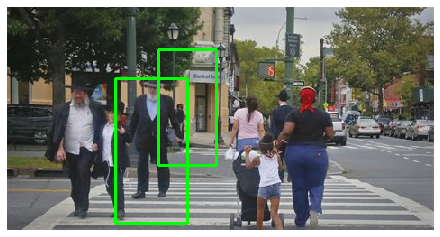

False

In [9]:
# We test it on other images

img3 = cv2.imread("Pedestrians//Registered_01.jpg")
[result3, coord3, rect3] = human_detection(img3, conf_thresh=0.2)
# The execution of this cell couldn't be recorded as it takes too much time, but it was indeed executed
print("coord : ", coord3)
print("rect : ", rect3)
display_img(result3)
cv2.imwrite("/content/drive/MyDrive/Projects:  Saad - Dabrowski/IASR/For code/Results/Registered_01_detection.jpg", result3)

coord :  [[360 240]
 [270 240]
 [410 260]
 [110 240]
 [310 260]
 [ 70 220]]
rect :  [[320  80 400 240]
 [230  80 310 240]
 [370 100 450 260]
 [ 70  80 150 240]
 [270 100 350 260]
 [ 30  60 110 220]]


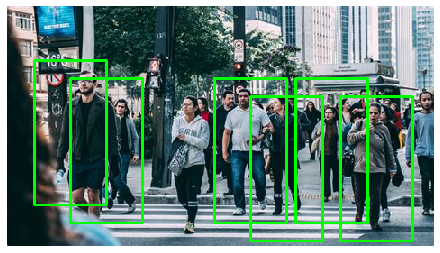

False

In [10]:
# We test it on other images

img4 = cv2.imread("Pedestrians//Registered_02.jpg")
[result4, coord4, rect4] = human_detection(img4, conf_thresh=0.2)
# The execution of this cell couldn't be recorded as it takes too much time, but it was indeed executed
print("coord : ", coord4)
print("rect : ", rect4)
display_img(result4)
cv2.imwrite("/content/drive/MyDrive/Projects:  Saad - Dabrowski/IASR/For code/Results/Registered_02_detection.jpg", result4)

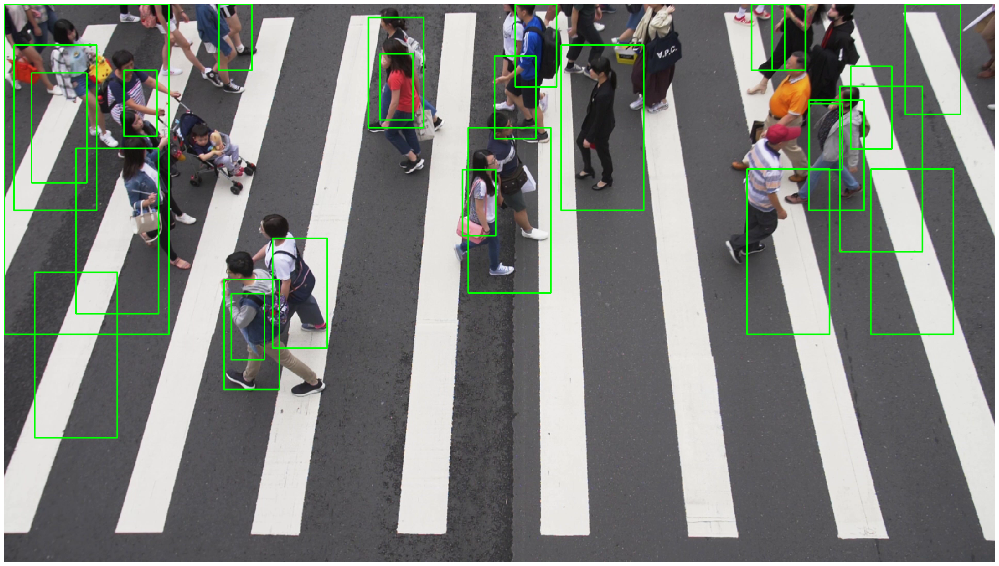

False

In [11]:
vidcap = cv2.VideoCapture('Pedestrians//190625_04_CityMisc_HD_04.mp4')
c_th = 0.5
vidcap.set(1, 1400)
success,frame = vidcap.read()
cv2.imwrite("Results//frame_img01.jpg", frame)
[frame_det, coord_det, rect_det] = human_detection(frame, c_th)
display_img(frame_det)
cv2.imwrite("/content/drive/MyDrive/Projects:  Saad - Dabrowski/IASR/For code/Results/Det_img1.jpg", frame_det)

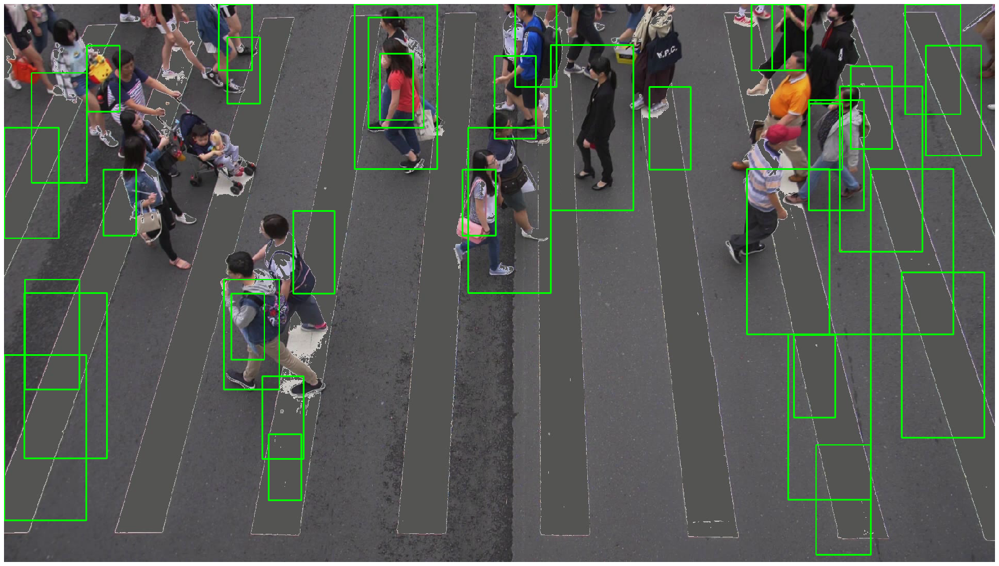

True

In [12]:
vidcap = cv2.VideoCapture('Pedestrians//NoStripes.avi')
c_th = 0.5
vidcap.set(1, 1400)
success,frame = vidcap.read()
cv2.imwrite("Results//frame_img02.jpg", frame)
[frame_det, coord_det, rect_det] = human_detection(frame, c_th)
display_img(frame_det)
cv2.imwrite("Results//Det_img2.jpg", frame_det)

## Homography
Here, we use a method to find the homography matrix from an array of source points from the original image, and an array of destination points in a projected space. That homography matrix is then used to compute the distance in the projected space between two points in the original image.

In [13]:
## Computing the functions

def computeHomography(p_src, p_dst):
  '''
  This function computes the homography matrix H from 4 source points (p_src) and 4 destination points (p_dst).
  '''
  A = []
  for i in range(0, len(p_src)):
    x, y = p_src[i][0], p_src[i][1]
    u, v = p_dst[i][0], p_dst[i][1]
    A.append([x, y, 1, 0, 0, 0, -u*x, -u*y, -u])
    A.append([0, 0, 0, x, y, 1, -v*x, -v*y, -v])
    # The matrix A is built iteratively using the 4 source points and the 4 destination points
  A = np.asarray(A)
  U, S, Vh = np.linalg.svd(A)
  L = Vh[-1,:] / Vh[-1,-1]
  # We use singular value decomposition to find L the eigen vector of A
  H = L.reshape(3, 3)
  # We reshape L to find H
  return H

def computeDistance(p1, p2, H):
    '''
    This function applies the homography transformation H to points p1 and p2, then returns the distance between them.
    '''
    # The input points p1 and p2 are represented in 3-d.
    p1, p2 = np.array([p1[0],p1[1],1]), np.array([p2[0],p2[1],1])
    # These are predefined known reference points in the real world to compare with their computed distance.
    # The point p1 is the bottom right most pixel and p2 is the bottom left most pixel of the third stripe.
    ref_p1, ref_p2 = np.array([1620,1035,1]), np.array([1715,1035,1])
    p1_trans, p2_trans, ref_p1_trans, ref_p2_trans = np.array([0,0,0]), np.array([0,0,0]), np.array([0,0,0]), np.array([0,0,0])
    for i in range(H.shape[0]):
        for j in range(H.shape[1]):
            p1_trans[i] += H[i][j] * p1[j]
            p2_trans[i] += H[i][j] * p2[j]
            ref_p1_trans[i] += H[i][j] * ref_p1[j]
            ref_p2_trans[i] += H[i][j] * ref_p2[j]
    # This returns the L2 norm of ref_p1_trans - ref_p2_trans
    ref_l2 = np.linalg.norm(ref_p1_trans - ref_p2_trans) 
    # This returns the L2 norm of p1_trans - p2_trans
    l2 = np.linalg.norm(p1_trans - p2_trans) 
    # Thus we get the relation equation distance = (50/ref_l2)l2 where we assume that the width of each stripe of the crosswalk is 50 cm wide.
    dist = (50/ref_l2) * l2
    return dist

In [14]:
vidcap = cv2.VideoCapture('Pedestrians//190625_04_CityMisc_HD_04.mp4')
success,image = vidcap.read()

# The points are in the following order: bottom right, top right, bottom left, and top left.
p_src =  np.array([[1715,1035],[1459,14],[215,1023],[502,27]])
p_dst =  np.array([[1715,1035],[1715,14],[215,1035],[215,14]])

# We have computed once and for all the homography matrix for the chosen video
H = computeHomography(p_src, p_dst)

file = open('Saved//Homography_matrix','wb')
dill.dump(H, file)
file.close()

### Importing an already computed homography matrix

In [15]:
file = open('Saved//Homography_matrix','rb')
H = dill.load(file)
file.close()

### Experimentation about shifting the perspective using the homography

[[ 1.66250115e+00  6.03456556e-01 -6.29192267e+02]
 [ 2.28943152e-02  1.66239895e+00 -4.19429602e+01]
 [ 3.02708602e-05  5.87338955e-04  1.00000000e+00]]


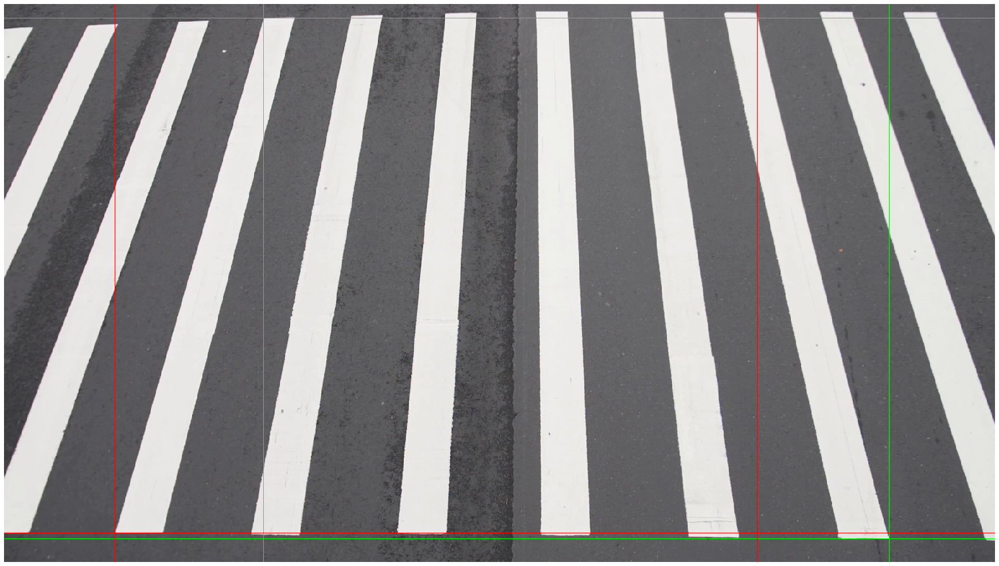

True

In [16]:
image = cv2.line(image,(1715,0),(1715,1080),(0,255,0),1) # right green vertical line
image = cv2.line(image,(0,1035),(1920,1035),(0,255,0),1) # bottom green horizontal line

image = cv2.line(image,(1459,0),(1459,1080),(0,0,255),1) # right blue vertical line
image = cv2.line(image,(0,14),(1920,14),(0,0,255),1) # top blue horizontal line

image = cv2.line(image,(502,0),(502,1080),(0,255,0),1) # left green vertical line
image = cv2.line(image,(0,27),(1920,27),(0,255,0),1) # top green horizontal line

image = cv2.line(image,(215,0),(215,1080),(0,0,255),1) # left blue vertical line
image = cv2.line(image,(0,1023),(1920,1023),(0,0,255),1) # bottom blue horizontal line

print(H)
display_img(image)
cv2.imwrite("Results//InitialImage.jpg", image)

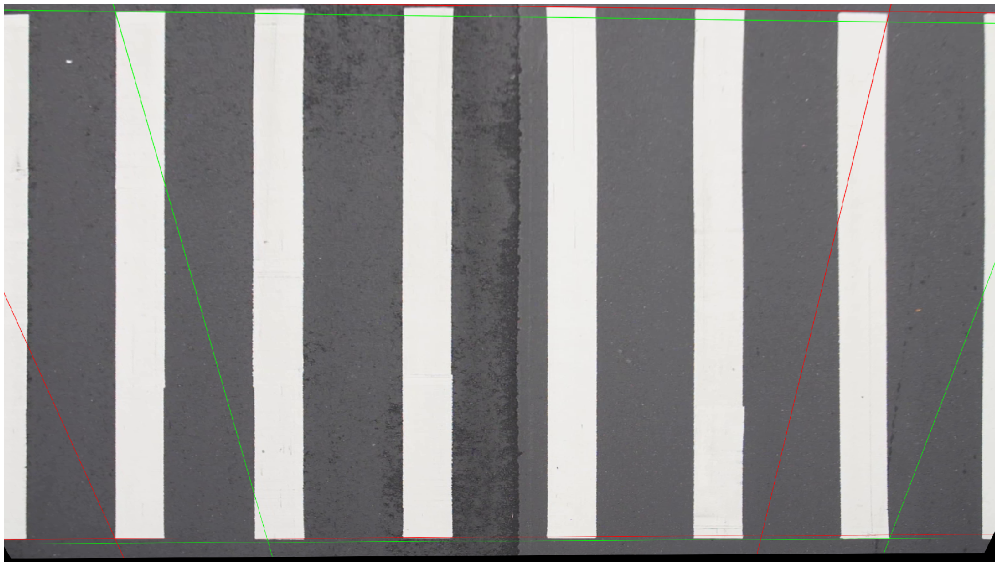

True

In [17]:
image2 = cv2.warpPerspective(image, H, (image.shape[1],image.shape[0]))
display_img(image2)
cv2.imwrite("Results//WarpedImage.jpg", image2)

## Using the homography to compute distances

In [18]:
file = open('Saved//Homography_matrix','rb')
H = dill.load(file)
file.close()

import copy

# This function works on an image where humans have already been detected
def social_distancing(img0, coord, rect, H=H):
  img = copy.deepcopy(img0)
  line_nsd = []
  rect_nsd = []
  for i in range(len(coord)):
    [xi, yi] = coord[i]
    # We look at every coordinates corresponding to a detected human
    for j in range(i, len(coord)):
      [xj, yj] = coord[j]
      dist = computeDistance(coord[i], coord[j], H)
      # We look at the distance between each point and all the others
      if dist < 182.88:
        # If the social distancing is not respected:
        rect_nsd.append(rect[i])
        rect_nsd.append(rect[j])
        line_nsd.append([coord[i], coord[j]])
        # We create a list with bounding boxes of people not respecting the social distancing
        # And an other list with the coordinates of the lines to draw between people not respecting it
  rect_nsd = np.array(rect_nsd)
  line_nsd = np.array(line_nsd)
  for r in rect_nsd:
    cv2.rectangle(img, (r[0], r[1]), (r[2], r[3]), (0, 0, 255), 2)
  for l in line_nsd:
    p1 = l[0]
    p2 = l[1]
    cv2.line(img, (p1[0], p1[1]), (p2[0], p2[1]), (0, 0, 255), 2)
  # Then we draw an image where all saved bounding boxes and lines are drawn in red
  return [img, rect_nsd, line_nsd]

def SDM(img, conf_thresh, H=H):
  [img_d, coord, rect] = human_detection(img, conf_thresh)
  [img_m, rect_nsd, line_nsd] = social_distancing(img_d, coord, rect, H)
  # This function is pretty simple: it detects all humans and then checks if the social distancing is respected or not
  return [img_m, rect_nsd, line_nsd]

## Test of the Social Distancing algorithm
We can only test this part of the algorithm on screenshots from the final video as we need the homography for this part.

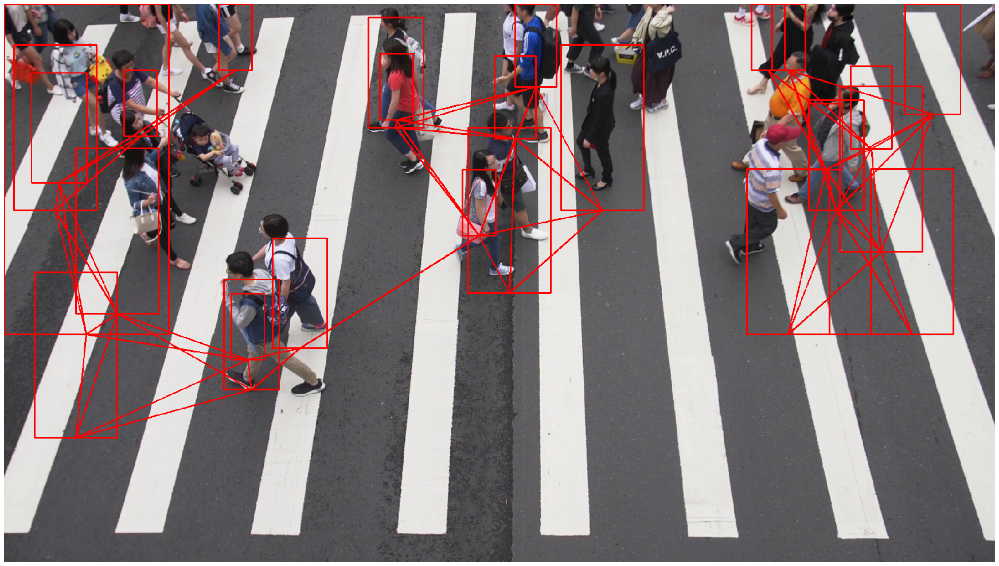

True

In [19]:
vidcap = cv2.VideoCapture('Pedestrians//190625_04_CityMisc_HD_04.mp4')
c_th = 0.5
vidcap.set(1, 1400)
success,frame = vidcap.read()
[frame_SDM, rect_SDM, line_SDM] = SDM(frame, c_th)
display_img(frame_SDM)
cv2.imwrite("Results//SDM_img1.jpg", frame_SDM)

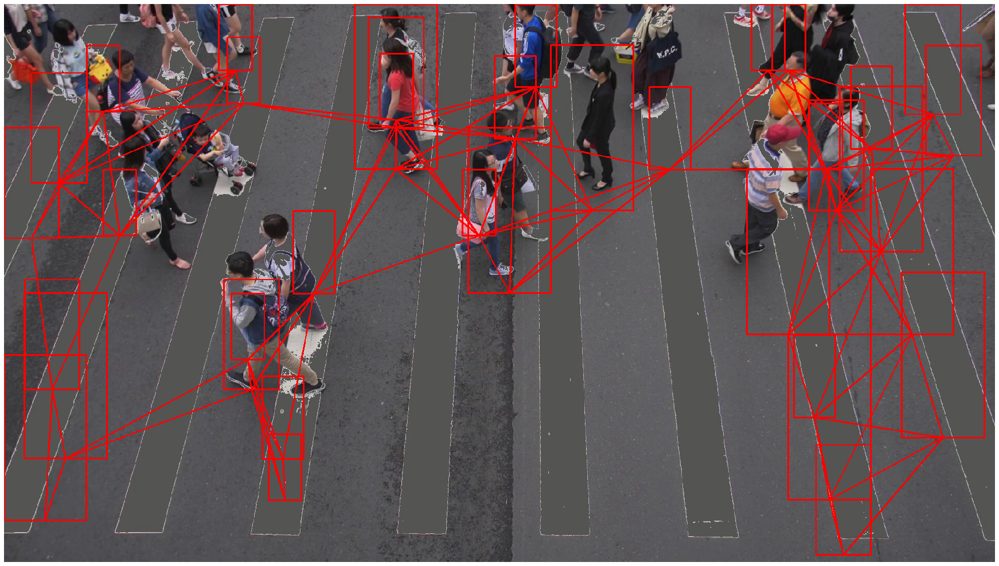

True

In [20]:
vidcap = cv2.VideoCapture('Pedestrians//NoStripes.avi')
c_th = 0.5
vidcap.set(1, 1400)
success,frame = vidcap.read()
[frame_SDM, rect_SDM, line_SDM] = SDM(frame, c_th)
display_img(frame_SDM)
cv2.imwrite("Results//SDM_img2.jpg", frame_SDM)

## Trying the new version of the SVM

#### Creating and training the new version of the SVM
This new version of the SVM has been trained with a dataset in which pictures of stripes from the crosswalk has been used as negative samples.

In [ ]:
train_data = pd.read_csv("Datasets//Train//train_data_b2.csv", index_col=0)
test_data = pd.read_csv("Datasets//Train//test_data_b.csv", index_col=0)
train_data = train_data.dropna() # We drop all invalid values,
test_data = test_data.dropna()   # whatever phase of the dataframes building they come from

X_train = train_data.drop("label", axis="columns")
Y_train = train_data["label"]
X_test = test_data.drop("label", axis="columns")
Y_test = test_data["label"]

SVM = Linear_SVM(X=X_train, y=Y_train, iter_nb=10000, lr=1e-3, C=30)
SVM.fit_with_false_pos()
SVM.test(X_test, Y_test, conf_thresh=0.6)

SVM.X = None
SVM.y = None
# The X and y attributes are useless once the training is over and take a huge amount of disk space
# so we set them to None before saving the model. Basically, we only need w, but we keep some other attributes
# in case we would want to get some informations about how the training has been done (except info about X and y).
file = open('Saved//SVM_b_2.0','wb')
dill.dump(SVM, file)
file.close()

#### Importing it

In [21]:
file2 = open('Saved//SVM_b_2.0','rb')
SVM = dill.load(file2)
file2.close()

#### Trying the human detection

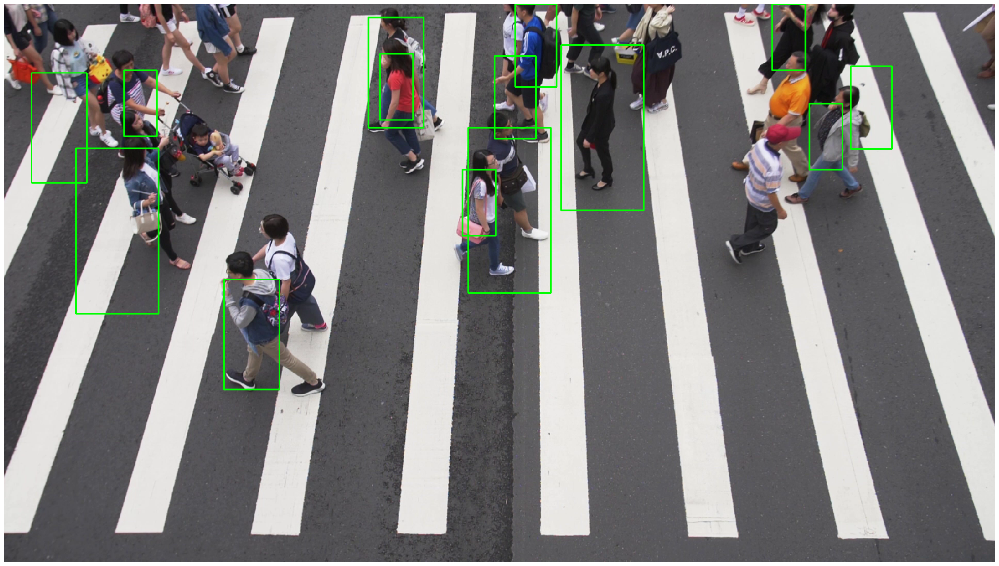

True

In [22]:
vidcap = cv2.VideoCapture('Pedestrians//190625_04_CityMisc_HD_04.mp4')
c_th = 0.5
vidcap.set(1, 1400)
success,frame = vidcap.read()
cv2.imwrite("Results//frame_img01.jpg", frame)
[frame_det, coord_det, rect_det] = human_detection(frame, c_th)
display_img(frame_det)
cv2.imwrite("Results//Det_img3.jpg", frame_det)

#### Trying the SDM function

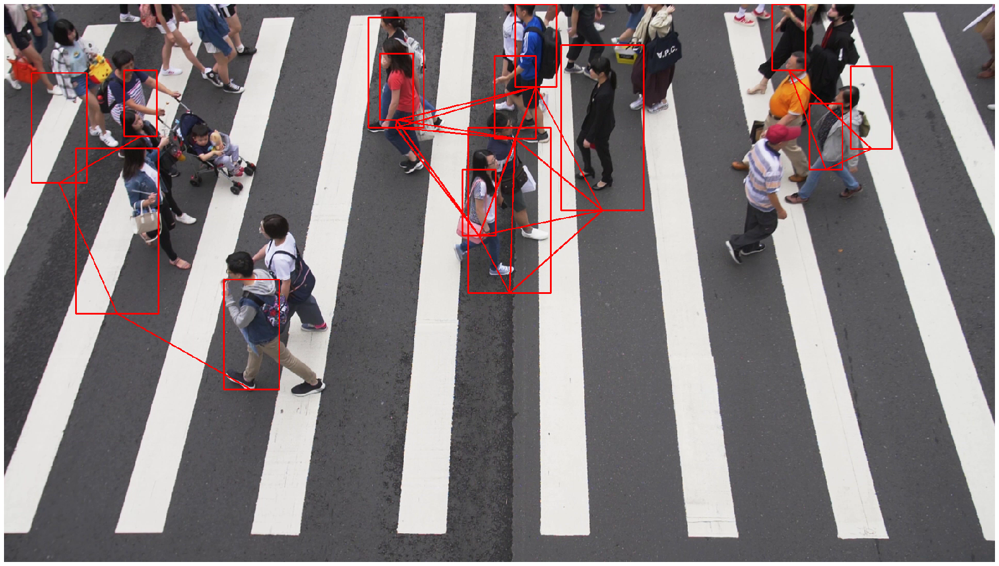

True

In [23]:
vidcap = cv2.VideoCapture('Pedestrians//190625_04_CityMisc_HD_04.mp4')
c_th = 0.5
vidcap.set(1, 1400)
success,frame = vidcap.read()
[frame_SDM, rect_SDM, line_SDM] = SDM(frame, c_th)
display_img(frame_SDM)
cv2.imwrite("Results//SDM_img3.jpg", frame_SDM)

## Producing the final result

In [23]:
# Import the video
vidcapS = cv2.VideoCapture('Pedestrians//190625_04_CityMisc_HD_04.mp4')
size = (int(vidcapS.get(3)), int(vidcapS.get(4)))
c_th = 0.5
#Specify the characteristics of the video to be saved
result = cv2.VideoWriter('Results//SDM_Vid.mp4',
                         cv2.VideoWriter_fourcc(*'MJPG'),
                         25, size)
rect_red = np.array([])
line_to_draw = np.array([])
while(True):
  success,frame = vidcapS.read()
  if success:
    if i % 12 == 0:
      [frameSDM, rect_red, line_to_draw] = SDM(frame, c_th)
      # We extract all the frames from the input video, run our algo on each of them, and write a new video
    else:
      frameSDM = frame
      for r in rect_red:
        cv2.rectangle(frameSDM, (r[0], r[1]), (r[2], r[3]), (0, 0, 255), 2)
      for l in line_to_draw:
        p1 = l[0]
        p2 = l[1]
        cv2.line(frameSDM, (p1[0], p1[1]), (p2[0], p2[1]), (0, 0, 255), 2)
    result.write(frameSDM)
    i = i+1
result.release()